# Projet de prédiction des prix de AirBnB

## Chargement des données

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, classification_report, accuracy_score
from sklearn import linear_model
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
import warnings
import folium

In [2]:
airbnb_train = pd.read_csv('airbnb_train.csv')
airbnb_test = pd.read_csv('airbnb_test.csv')

## 1- Exploration nettoyage et prétraitement des données

### airbnb_train

In [3]:
pd.options.display.max_columns = None
warnings.filterwarnings("ignore")

La ligne ci-dessus nous permet d'afficher toutes les colonnes de nos dataframes. Cela nous permet d'avoir une vision plus complète de nos données.

In [4]:
airbnb_train.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1.0,Real Bed,flexible,False,LA,Large bright airy room with 2 balconies and Ja...,NaN,t,f,NaN,2015-12-12,t,NaN,33.782712,-118.134410,Island style Spa Studio,Long Beach,0,NaN,90804,0.0,2.0
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2.0,Real Bed,strict,False,NYC,Private room for rent in a six bedroom apt wit...,2017-05-07,t,t,100%,2016-11-04,t,2017-09-17,40.705468,-73.909439,"Beautiful and Simple Room W/2 Beds, 25 Mins to...",Ridgewood,38,86.0,11385,1.0,2.0
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2.0,Real Bed,flexible,False,DC,"14th st corridor 2br/2ba condo, secure boutiqu...",NaN,t,f,NaN,2016-12-11,t,NaN,38.917537,-77.031651,2br/2ba luxury condo perfect for infant / toddler,U Street Corridor,0,NaN,20009,2.0,2.0
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1.0,Real Bed,flexible,True,NYC,My place is close to Manhattan. You can see th...,2016-10-07,t,t,100%,2012-08-04,f,2017-09-29,40.736001,-73.924248,Manhattan view from Queens. Lovely single room .,Sunnyside,19,96.0,11104,1.0,1.0
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,moderate,True,SF,This beautiful home can be your dream destinat...,2016-09-25,t,t,100%,2013-07-25,f,2017-08-28,37.744896,-122.430665,Zen Captured Noe Valley House,Noe Valley,15,96.0,94131,2.0,2.0


In [5]:
airbnb_train.tail()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
22229,11989532,4.605170,Apartment,Private room,{},1,1.0,Real Bed,flexible,False,NYC,one room in bushwick apt,NaN,t,t,NaN,2013-03-24,f,NaN,40.709025,-73.939405,one room bushwick,Williamsburg,0,NaN,11206.0,1.0,1.0
22230,20652462,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2.0,Real Bed,moderate,True,LA,"Located on the Pacific Coast Highway, this apa...",2016-08-15,t,f,100%,2016-05-03,f,2017-04-15,33.871549,-118.396053,Spacious Hermosa 2 BR on PCH,Hermosa Beach,16,93.0,90254,2.0,4.0
22231,12380210,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1.0,Real Bed,moderate,True,NYC,A modern apartment located in East Williamsbur...,2015-01-03,t,t,100%,2012-01-05,t,2017-09-10,40.706749,-73.942377,Modern 2 Bedroom Apartment in Williamsburg,Williamsburg,43,94.0,11206.0,2.0,2.0
22232,19533966,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1.0,Real Bed,strict,True,NYC,"Fully renovated, designer's studio located in ...",NaN,t,f,100%,2017-09-17,t,NaN,40.738535,-74.000157,Designer's Apartment in HEART of NYC,West Village,0,NaN,10011,0.0,2.0
22233,18507240,4.852030,Boat,Entire home/apt,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",4,1.0,Real Bed,moderate,False,LA,You will stay-aboard the Island Trader at one ...,2013-09-05,t,t,100%,2012-11-26,f,2017-04-30,33.761096,-118.192409,Cozy Boat at Shoreline Village,Long Beach,205,96.0,90802,1.0,2.0


Nous voyons en explorant les données du dataset d'entrainement plusieurs colonnes pouvant avoir un impact significatif sur le prix. On peut citer `room_type`, `amenities` et `accommodates`,..

In [6]:
airbnb_train.shape

(22234, 28)

In [7]:
airbnb_train.describe()

,id,log_price,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
count,2.223400e+04,22234.000000,22234.000000,22183.000000,22234.000000,22234.000000,22234.000000,17256.000000,22208.000000,22199.000000
mean,1.122269e+07,4.783481,3.155573,1.236037,38.462971,-92.269305,20.670774,94.069077,1.264769,1.711473
std,6.080480e+06,0.718758,2.143870,0.586246,3.071679,21.670081,37.183731,7.782235,0.852819,1.254903
min,3.362000e+03,2.302585,1.000000,0.000000,33.339002,-122.510940,0.000000,20.000000,0.000000,0.000000
25%,6.202924e+06,4.317488,2.000000,1.000000,34.136082,-118.340633,1.000000,92.000000,1.000000,1.000000
50%,1.217425e+07,4.700480,2.000000,1.000000,40.662632,-76.994944,6.000000,96.000000,1.000000,1.000000
75%,1.639502e+07,5.220356,4.000000,1.000000,40.746358,-73.954599,23.000000,100.000000,1.000000,2.000000
max,2.120450e+07,7.600402,16.000000,8.000000,42.390248,-70.989359,505.000000,100.000000,10.000000,18.000000


Nous remarquons que certaines valeurs sont à 0 (par exemple : `bedrooms`) ce qui signifie que certains logements n'ont pas de chambre.

In [8]:
airbnb_train.isna().sum()

id                           0
log_price                    0
property_type                0
room_type                    0
amenities                    0
accommodates                 0
bathrooms                   51
bed_type                     0
cancellation_policy          0
cleaning_fee                 0
city                         0
description                  0
first_review              4725
host_has_profile_pic        56
host_identity_verified      56
host_response_rate        5475
host_since                  56
instant_bookable             0
last_review               4716
latitude                     0
longitude                    0
name                         0
neighbourhood             2086
number_of_reviews            0
review_scores_rating      4978
zipcode                    303
bedrooms                    26
beds                        35
dtype: int64

Nous voyons qu'il y a beaucoup de données manquantes. On remarque que les colonnes `first_review`, `host_response_rate` `review_scores_rating` ont beaucoup de valeurs manquantes ce qui peut être normal. Donc nous n'allons pas modifier ces valeurs. En revanche, nous pensons les colonnes avec un nombre faible de valeurs manquantes sont anormales, nous alons donc supprimer les lignes. 

In [9]:
col = ['bathrooms', 'host_has_profile_pic', 'host_has_profile_pic', 'host_since', 'zipcode','bedrooms', 'beds']
airbnb_train.dropna(subset = col, inplace = True)

In [10]:
airbnb_train.isna().sum()

id                           0
log_price                    0
property_type                0
room_type                    0
amenities                    0
accommodates                 0
bathrooms                    0
bed_type                     0
cancellation_policy          0
cleaning_fee                 0
city                         0
description                  0
first_review              4613
host_has_profile_pic         0
host_identity_verified       0
host_response_rate        5305
host_since                   0
instant_bookable             0
last_review               4607
latitude                     0
longitude                    0
name                         0
neighbourhood             1962
number_of_reviews            0
review_scores_rating      4855
zipcode                      0
bedrooms                     0
beds                         0
dtype: int64

In [11]:
airbnb_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 22233
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      21783 non-null  int64  
 1   log_price               21783 non-null  float64
 2   property_type           21783 non-null  object 
 3   room_type               21783 non-null  object 
 4   amenities               21783 non-null  object 
 5   accommodates            21783 non-null  int64  
 6   bathrooms               21783 non-null  float64
 7   bed_type                21783 non-null  object 
 8   cancellation_policy     21783 non-null  object 
 9   cleaning_fee            21783 non-null  bool   
 10  city                    21783 non-null  object 
 11  description             21783 non-null  object 
 12  first_review            17170 non-null  object 
 13  host_has_profile_pic    21783 non-null  object 
 14  host_identity_verified  21783 non-null  obj

On remarque que certaines colonnes contiennent des données de type float (ex : `bathrooms`, `bedrooms`), ce qui n'est pas justifié. Des valeurs entières seraient plus pertinentes. Mêmes remarques pour les colonnes `first_review` et `last_review`. On va donc changer le typage des données.

In [12]:
airbnb_train['bathrooms'] = airbnb_train['bathrooms'].astype(int)
airbnb_train['bedrooms'] = airbnb_train['bedrooms'].astype(int)
airbnb_train['beds'] = airbnb_train['beds'].astype(int)

In [13]:
airbnb_train['first_review'] = pd.to_datetime(airbnb_train['first_review'], format='%Y-%m-%d')
airbnb_train['last_review'] = pd.to_datetime(airbnb_train['last_review'], format='%Y-%m-%d')

In [14]:
airbnb_train['host_has_profile_pic'] = np.where(airbnb_train['host_has_profile_pic'] == 't', True, False)
airbnb_train['host_identity_verified'] = np.where(airbnb_train['host_identity_verified'] == 't', True, False)
airbnb_train['instant_bookable'] = np.where(airbnb_train['instant_bookable'] == 't', True, False)

In [15]:
airbnb_train.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1,Real Bed,flexible,False,LA,Large bright airy room with 2 balconies and Ja...,NaT,True,False,NaN,2015-12-12,True,NaT,33.782712,-118.134410,Island style Spa Studio,Long Beach,0,NaN,90804,0,2
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2,Real Bed,strict,False,NYC,Private room for rent in a six bedroom apt wit...,2017-05-07,True,True,100%,2016-11-04,True,2017-09-17,40.705468,-73.909439,"Beautiful and Simple Room W/2 Beds, 25 Mins to...",Ridgewood,38,86.0,11385,1,2
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2,Real Bed,flexible,False,DC,"14th st corridor 2br/2ba condo, secure boutiqu...",NaT,True,False,NaN,2016-12-11,True,NaT,38.917537,-77.031651,2br/2ba luxury condo perfect for infant / toddler,U Street Corridor,0,NaN,20009,2,2
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1,Real Bed,flexible,True,NYC,My place is close to Manhattan. You can see th...,2016-10-07,True,True,100%,2012-08-04,False,2017-09-29,40.736001,-73.924248,Manhattan view from Queens. Lovely single room .,Sunnyside,19,96.0,11104,1,1
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,moderate,True,SF,This beautiful home can be your dream destinat...,2016-09-25,True,True,100%,2013-07-25,False,2017-08-28,37.744896,-122.430665,Zen Captured Noe Valley House,Noe Valley,15,96.0,94131,2,2


In [16]:
airbnb_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 22233
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      21783 non-null  int64         
 1   log_price               21783 non-null  float64       
 2   property_type           21783 non-null  object        
 3   room_type               21783 non-null  object        
 4   amenities               21783 non-null  object        
 5   accommodates            21783 non-null  int64         
 6   bathrooms               21783 non-null  int64         
 7   bed_type                21783 non-null  object        
 8   cancellation_policy     21783 non-null  object        
 9   cleaning_fee            21783 non-null  bool          
 10  city                    21783 non-null  object        
 11  description             21783 non-null  object        
 12  first_review            17170 non-null  datetime64[

In [17]:
airbnb_train.duplicated().sum()

0

On voit qu'il n'y a aucun doublon.

Nous allons maintenant voir le nombre de valeurs uniques de certaines colonnes afin de mieux pouvoir les transformer en valeurs numériques

In [18]:
airbnb_train['neighbourhood'].unique()

array(['Long Beach', 'Ridgewood', 'U Street Corridor', 'Sunnyside',
       'Noe Valley', 'West Village', 'Flushing', 'Westside',
       'Upper West Side', 'Shepherd Park', 'Santa Monica',
       'Mission District', 'Murray Hill', nan, 'Chinatown', 'Echo Park',
       'Hamilton Heights', 'Mar Vista', 'Encino', 'Kips Bay',
       'Williamsburg', 'West Hollywood', 'Carroll Gardens', 'Downtown',
       'Bedford-Stuyvesant', 'Wicker Park', "Hell's Kitchen",
       'Upper East Side', 'Pasadena', 'Shaw', 'Greenpoint',
       'Jackson Heights', 'Clinton Hill', 'Tompkinsville', 'Torrance',
       'Beverly Hills', 'Midtown', 'Harlem', 'Financial District',
       'Fort Greene', 'Pacific Heights', 'Mid-City', 'Chelsea', 'Venice',
       'Crown Heights', 'South LA', 'Bushwick', 'Parkchester', 'Glendale',
       'Columbia Street Waterfront', 'East Flatbush',
       'Western Addition/NOPA', 'Hollywood', 'East Village',
       'Lower East Side', 'Nolita', 'East Elmhurst', 'Soho',
       'The Rockaway

Nous remarquons que certaines colonnes comme `neighbourhood` ont beaucoup trop de valeurs possibles et ne sont donc pas pertinentes à utiliser.

In [19]:
airbnb_train['bed_type'].unique()

array(['Real Bed', 'Pull-out Sofa', 'Futon', 'Airbed', 'Couch'],
      dtype=object)

In [20]:
airbnb_train['cancellation_policy'].unique()

array(['flexible', 'strict', 'moderate', 'super_strict_30',
       'super_strict_60'], dtype=object)

In [21]:
airbnb_train['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [22]:
airbnb_train['property_type'].unique()

array(['House', 'Apartment', 'Guest suite', 'Condominium', 'Timeshare',
       'Chalet', 'Townhouse', 'Guesthouse', 'Bungalow', 'Loft', 'In-law',
       'Boat', 'Dorm', 'Other', 'Bed & Breakfast', 'Camper/RV', 'Villa',
       'Boutique hotel', 'Cabin', 'Hostel', 'Hut', 'Yurt',
       'Serviced apartment', 'Castle', 'Vacation home', 'Tent', 'Cave',
       'Tipi', 'Earth House', 'Island', 'Treehouse'], dtype=object)

Nous voyons qu'il y a plusieurs possibilités pour les colonnes `bed_type`, `cancellation_policy`, `room_type` et `property_type` ainsi nous allons les convertir en catégories numériques pour qu'elles soient utilisables par un algorithme de machine learning.

Afin de réfléchir aux futurs caractéristiques pour notre prédiction, nous allons faire une matrice de corrélation.

In [23]:
airbnb_train.shape

(21783, 28)

Nous avons voulu dans un premier temps séparer tous les éléments distincts de la colonne `amenities` pour mieux les faire rentrer dans notre matrice de corrélation. Cependant le fait de faire ça nous rajoute 124 colonnes ce qui n'est pas possible.

Après réflexion, nous avons envisagé la solution suivante : 

Nous allons sélectionner les 10 amenities les plus courantes.

Les 10 amenities qui semblent avoir le plus d'impact sur le prix du logement.

Nous allons garder la liste des amenities qui se trouvent dans les 2 listes. 

De cette manière nous allons réduire la dimension des amenities et garder les plus utiles et impactant.

On va d'abord copier notre dataframe pour effectuer ces opérations et nous sortirons le TOP 10 pour les travailler sur notre dataframe principal.

In [24]:
airbnb_amenities = airbnb_train[['amenities']].copy()

In [25]:
airbnb_amenities

,amenities
0,"{TV,""Wireless Internet"",Kitchen,""Free parking ..."
1,"{""Wireless Internet"",""Air conditioning"",Kitche..."
2,"{TV,""Wireless Internet"",""Air conditioning"",Kit..."
3,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A..."
4,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki..."
...,...
22229,{}
22230,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki..."
22231,"{TV,Internet,""Wireless Internet"",""Air conditio..."
22232,"{TV,""Wireless Internet"",""Air conditioning"",Kit..."


In [26]:
airbnb_amenities['amenities'] = airbnb_amenities['amenities'].astype(str)

airbnb_amenities['amenities'] = airbnb_amenities['amenities'].str.replace(r'[{}"]', '', regex=True)

amenities_encoded = airbnb_amenities['amenities'].str.get_dummies(',')

airbnb_amenities = pd.concat([airbnb_amenities, amenities_encoded], axis=1)

airbnb_amenities

,amenities,smooth pathway to front door,24-hour check-in,Accessible-height bed,Accessible-height toilet,Air conditioning,Air purifier,BBQ grill,Baby bath,Baby monitor,Babysitter recommendations,Bathtub,Bathtub with shower chair,Beach essentials,Beachfront,Bed linens,Breakfast,Buzzer/wireless intercom,Cable TV,Carbon monoxide detector,Cat(s),Changing table,Children’s books and toys,Children’s dinnerware,Cleaning before checkout,Coffee maker,Cooking basics,Crib,Disabled parking spot,Dishes and silverware,Dishwasher,Dog(s),Doorman,Doorman Entry,Dryer,EV charger,Elevator,Elevator in building,Essentials,Ethernet connection,Extra pillows and blankets,Family/kid friendly,Fire extinguisher,Fireplace guards,Firm matress,Firm mattress,First aid kit,Fixed grab bars for shower & toilet,Flat,Flat smooth pathway to front door,Free parking on premises,Free parking on street,Game console,Garden or backyard,Grab-rails for shower and toilet,Ground floor access,Gym,Hair dryer,Handheld shower head,Hangers,Heating,High chair,Host greets you,Hot tub,Hot water,Hot water kettle,Indoor fireplace,Internet,Iron,Keypad,Kitchen,Lake access,Laptop friendly workspace,Lock on bedroom door,Lockbox,Long term stays allowed,Luggage dropoff allowed,Microwave,Other,Other pet(s),Outlet covers,Oven,Pack ’n Play/travel crib,Paid parking off premises,Path to entrance lit at night,Patio or balcony,Pets allowed,Pets live on this property,Pocket wifi,Pool,Private bathroom,Private entrance,Private living room,Refrigerator,Roll-in shower with chair,Room-darkening shades,Safety card,Self Check-In,Shampoo,Single level home,Ski in/Ski out,Smart lock,Smartlock,Smoke detector,Smoking allowed,Stair gates,Step-free access,Stove,Suitable for events,TV,Table corner guards,Washer,Washer / Dryer,Waterfront,Well-lit path to entrance,Wheelchair accessible,Wide clearance to bed,Wide clearance to shower & toilet,Wide doorway,Wide entryway,Wide hallway clearance,Window guards,Wireless Internet,translation missing: en.hosting_amenity_49,translation missing: en.hosting_amenity_50
0,"TV,Wireless Internet,Kitchen,Free parking on p...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,"Wireless Internet,Air conditioning,Kitchen,Hea...",0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,"TV,Wireless Internet,Air conditioning,Kitchen,...",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,"TV,Cable TV,Internet,Wireless Internet,Air con...",0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
4,"TV,Cable TV,Internet,Wireless Internet,Kitchen...",0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [27]:
a = amenities_encoded.sum().sort_values(ascending = False).head(11).index.to_series()

Nous avons ici les 10 variables les plus représentées.

Nous allons extraire les 10 variables qui semblent avoir le plus d'impact sur le prix du logement. Comme nous avons 125 variables et que nous voulons la corrélation avec 1 seule autre variable (logarithme du prix), nous allons vérifier la corrélation avec chacune des variables dans une matrice et extraire les 10 meilleurs.

In [28]:
amenities_encoded['log_price'] = airbnb_train['log_price']

In [29]:
correlation_matrix = amenities_encoded.corr()

amenities_corr_with_log_price = correlation_matrix['log_price'].sort_values(ascending=False)

b = amenities_corr_with_log_price.head(11).index.to_series()

In [30]:
print(a.index.intersection(b.index))

Index(['TV'], dtype='object')


Nous voyons que 10 n'est pas suffisant car nous avons qu'un seul amenities en commun dans les 2 listes. Nous allons donc augmenter notre échantillon à 15.

In [31]:
a2 = amenities_encoded.sum().sort_values(ascending = False).head(16).index.to_series()
b2 = amenities_corr_with_log_price.head(16).index.to_series()

In [32]:
amenities = a2.index.intersection(b2.index)[1:]

In [33]:
print(a2.index.intersection(b2.index))

Index(['log_price', 'Kitchen', 'Heating', 'TV', 'Washer', 'Hair dryer',
       'Dryer'],
      dtype='object')


Grâce à notre méthode nous avons extrait des 6 amenities que nous allons étudier. Retournons à notre dataframe et intéressons nous à ces 6 derniers.

In [34]:
airbnb_train

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1,Real Bed,flexible,False,LA,Large bright airy room with 2 balconies and Ja...,NaT,True,False,NaN,2015-12-12,True,NaT,33.782712,-118.134410,Island style Spa Studio,Long Beach,0,NaN,90804,0,2
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2,Real Bed,strict,False,NYC,Private room for rent in a six bedroom apt wit...,2017-05-07,True,True,100%,2016-11-04,True,2017-09-17,40.705468,-73.909439,"Beautiful and Simple Room W/2 Beds, 25 Mins to...",Ridgewood,38,86.0,11385,1,2
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2,Real Bed,flexible,False,DC,"14th st corridor 2br/2ba condo, secure boutiqu...",NaT,True,False,NaN,2016-12-11,True,NaT,38.917537,-77.031651,2br/2ba luxury condo perfect for infant / toddler,U Street Corridor,0,NaN,20009,2,2
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1,Real Bed,flexible,True,NYC,My place is close to Manhattan. You can see th...,2016-10-07,True,True,100%,2012-08-04,False,2017-09-29,40.736001,-73.924248,Manhattan view from Queens. Lovely single room .,Sunnyside,19,96.0,11104,1,1
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,moderate,True,SF,This beautiful home can be your dream destinat...,2016-09-25,True,True,100%,2013-07-25,False,2017-08-28,37.744896,-122.430665,Zen Captured Noe Valley House,Noe Valley,15,96.0,94131,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22229,11989532,4.605170,Apartment,Private room,{},1,1,Real Bed,flexible,False,NYC,one room in bushwick apt,NaT,True,True,NaN,2013-03-24,False,NaT,40.709025,-73.939405,one room bushwick,Williamsburg,0,NaN,11206.0,1,1
22230,20652462,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2,Real Bed,moderate,True,LA,"Located on the Pacific Coast Highway, this apa...",2016-08-15,True,False,100%,2016-05-03,False,2017-04-15,33.871549,-118.396053,Spacious Hermosa 2 BR on PCH,Hermosa Beach,16,93.0,90254,2,4
22231,12380210,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1,Real Bed,moderate,True,NYC,A modern apartment located in East Williamsbur...,2015-01-03,True,True,100%,2012-01-05,True,2017-09-10,40.706749,-73.942377,Modern 2 Bedroom Apartment in Williamsburg,Williamsburg,43,94.0,11206.0,2,2
22232,19533966,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1,Real Bed,strict,True,NYC,"Fully renovated, designer's studio located in ...",NaT,True,False,100%,2017-09-17,True,NaT,40.738535,-74.000157,Designer's Apartment in HEART of NYC,West Village,0,NaN,10011,0,2


In [35]:
airbnb_train = pd.concat([airbnb_train, amenities_encoded[amenities]], axis = 1)
airbnb_train

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1,Real Bed,flexible,False,LA,Large bright airy room with 2 balconies and Ja...,NaT,True,False,NaN,2015-12-12,True,NaT,33.782712,-118.134410,Island style Spa Studio,Long Beach,0,NaN,90804,0,2,1,0,1,1,1,1
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2,Real Bed,strict,False,NYC,Private room for rent in a six bedroom apt wit...,2017-05-07,True,True,100%,2016-11-04,True,2017-09-17,40.705468,-73.909439,"Beautiful and Simple Room W/2 Beds, 25 Mins to...",Ridgewood,38,86.0,11385,1,2,1,1,0,0,1,0
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2,Real Bed,flexible,False,DC,"14th st corridor 2br/2ba condo, secure boutiqu...",NaT,True,False,NaN,2016-12-11,True,NaT,38.917537,-77.031651,2br/2ba luxury condo perfect for infant / toddler,U Street Corridor,0,NaN,20009,2,2,1,1,1,1,0,1
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1,Real Bed,flexible,True,NYC,My place is close to Manhattan. You can see th...,2016-10-07,True,True,100%,2012-08-04,False,2017-09-29,40.736001,-73.924248,Manhattan view from Queens. Lovely single room .,Sunnyside,19,96.0,11104,1,1,1,1,1,0,1,0
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,moderate,True,SF,This beautiful home can be your dream destinat...,2016-09-25,True,True,100%,2013-07-25,False,2017-08-28,37.744896,-122.430665,Zen Captured Noe Valley House,Noe Valley,15,96.0,94131,2,2,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22229,11989532,4.605170,Apartment,Private room,{},1,1,Real Bed,flexible,False,NYC,one room in bushwick apt,NaT,True,True,NaN,2013-03-24,False,NaT,40.709025,-73.939405,one room bushwick,Williamsburg,0,NaN,11206.0,1,1,0,0,0,0,0,0
22230,20652462,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2,Real Bed,moderate,True,LA,"Located on the Pacific Coast Highway, this apa...",2016-08-15,True,False,100%,2016-05-03,False,2017-04-15,33.871549,-118.396053,Spacious Hermosa 2 BR on PCH,Hermosa Beach,16,93.0,90254,2,4,1,1,1,1,1,1
22231,12380210,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1,Real Bed,moderate,True,NYC,A modern apartment located in East Williamsbur...,2015-01-03,True,True,100%,2012-01-05,True,2017-09-10,40.706749,-73.942377,Modern 2 Bedroom Apartment in Williamsburg,Williamsburg,43,94.0,11206.0,2,2,1,1,1,1,1,1
22232,19533966,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1,Real Bed,strict,True,NYC,"Fully renovated, designer's studio located in ...",NaT,True,False,100%,2017-09-17,True,NaT,40.738535,-74.000157,Designer's Apartment in HEART of NYC,West Village,0,NaN,10011,0,2,1,1,1,1,1,1


In [36]:
airbnb_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 22233
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      21783 non-null  int64         
 1   log_price               21783 non-null  float64       
 2   property_type           21783 non-null  object        
 3   room_type               21783 non-null  object        
 4   amenities               21783 non-null  object        
 5   accommodates            21783 non-null  int64         
 6   bathrooms               21783 non-null  int64         
 7   bed_type                21783 non-null  object        
 8   cancellation_policy     21783 non-null  object        
 9   cleaning_fee            21783 non-null  bool          
 10  city                    21783 non-null  object        
 11  description             21783 non-null  object        
 12  first_review            17170 non-null  datetime64[

Nous allons maintenant nous attarder un peu sur la variable `cancellation_policy` pour voir l'impact de la politique d’annulation sur le logarithme du prix.

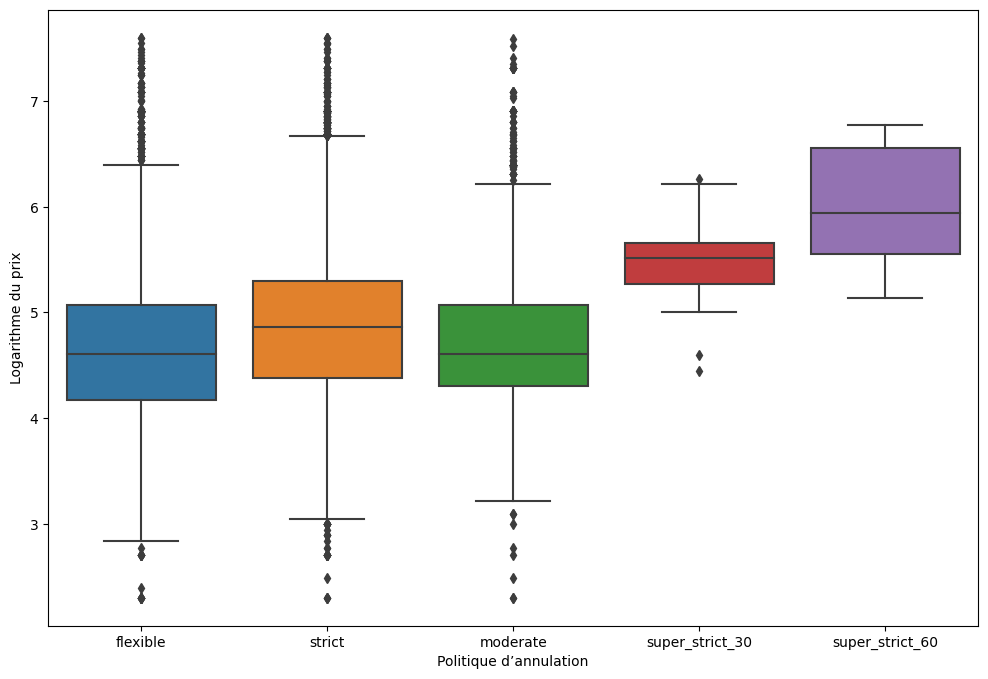

In [37]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='cancellation_policy', y='log_price', data=airbnb_train)
plt.xlabel('Politique d’annulation')
plt.ylabel('Logarithme du prix')
plt.show()

Ici nous voyons que la politique `stric` et `flexible` possèdent une médiane élevée (un peu supérieure au milieu) mais également un grand nombre de valeur élevé (longues lignes verticales appellées moustaches). Nous pouvons en déduire qu'elle permet d'obtenir des prix plus élevés et a donc un impact plus significatif que la politique `super_strict_30` qui elle a peu de dispersion (boîte étroite) et une médiane élevée. Ces prix sont plus uniformes et donc ont un impact plus discret sur le prix du airbnb.

Nous voyons donc que la politique d'annulation a un impact sur le prix (plus ou moins selon le type d'annulation).

Nous allons étudier l'impact de la variable `host_identity_verified` sur le prix :

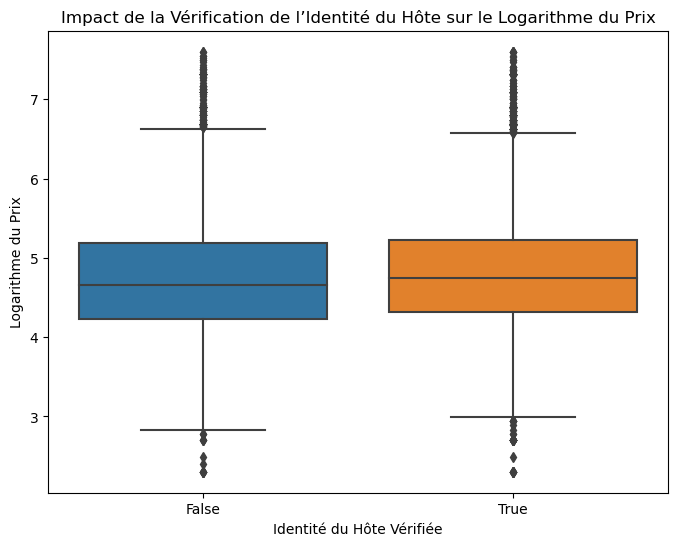

In [38]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='host_identity_verified', y='log_price', data=airbnb_train)
plt.title('Impact de la Vérification de l’Identité du Hôte sur le Logarithme du Prix')
plt.xlabel('Identité du Hôte Vérifiée')
plt.ylabel('Logarithme du Prix')
plt.show()

Nous voyons que les médianes sont presques au même niveau et que les moustaches sont assez similaires ce qui signifi que cette variable apporte peu de variation au prix. Nous n'allons donc pas retenir ce critère.

Nous allons à présent étudier l'impact de la variable `number_of_reviews` sur le prix :

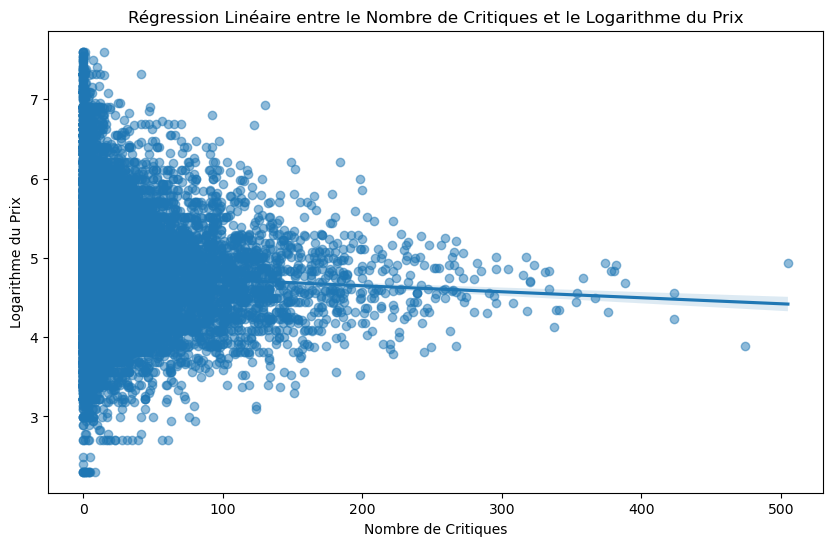

In [39]:
plt.figure(figsize=(10, 6))
sns.regplot(x='number_of_reviews', y='log_price', data=airbnb_train, scatter_kws={'alpha':0.5})
plt.title('Régression Linéaire entre le Nombre de Critiques et le Logarithme du Prix')
plt.xlabel('Nombre de Critiques')
plt.ylabel('Logarithme du Prix')
plt.show()

Bien que la ligne de régression montre une légère tendance négative, c'est pas très prononcé. Cela nous indique que le nombre d'avis a un impact relativement faible sur le prix. C'est pour cette raison que nous n'allons pas garder cette variable.

Faisons pareil pour la variable `review_scores_rating`

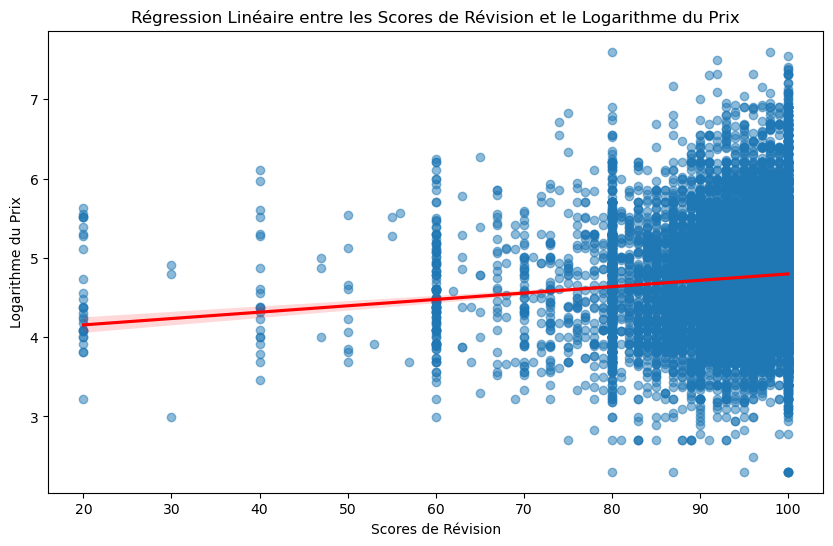

In [40]:
plt.figure(figsize=(10, 6))
sns.regplot(x='review_scores_rating', y='log_price', data=airbnb_train, scatter_kws={'alpha':0.5}, line_kws={'color': 'red'})
plt.title('Régression Linéaire entre les Scores de Révision et le Logarithme du Prix')
plt.xlabel('Scores de Révision')
plt.ylabel('Logarithme du Prix')
plt.show()

La ligne de régression est presque horizontale, donc il y a une très faible corrélation linéaire. Cela suggère que `review_scores_rating` n'a pas un impact significatif sur le prix.

Après inspection, nous pensons que certaines colonnes n'ont pas d'impact dans le prix de nos AirBnB. Ainsi nous allons supprimer ces colonnes pour nous concentrer sur celles qui auront vraisemblablement un impact dans notre prédiction du prix des AirBnB. Parmis ces colonnes nous avons : `description`, `first_review`, `host_has_profile_pic`, `host_response_rate`, `last_review`, `name` et `zipcode`.

De plus, comme nous avons trouvé les variables amenities qui sont intéressantes, nous allons aussi supprimer la colonne.

In [41]:
nom_suppr = ["amenities", "description", "first_review", "host_has_profile_pic", "host_response_rate", "last_review", "name", "zipcode"]
airbnb_train.drop(nom_suppr, axis = 1, inplace = True)

In [42]:
airbnb_train

,id,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_since,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,5708593,4.317488,House,Private room,3,1,Real Bed,flexible,False,LA,False,2015-12-12,True,33.782712,-118.134410,Long Beach,0,NaN,0,2,1,0,1,1,1,1
1,14483613,4.007333,House,Private room,4,2,Real Bed,strict,False,NYC,True,2016-11-04,True,40.705468,-73.909439,Ridgewood,38,86.0,1,2,1,1,0,0,1,0
2,10412649,7.090077,Apartment,Entire home/apt,6,2,Real Bed,flexible,False,DC,False,2016-12-11,True,38.917537,-77.031651,U Street Corridor,0,NaN,2,2,1,1,1,1,0,1
3,17954362,3.555348,House,Private room,1,1,Real Bed,flexible,True,NYC,True,2012-08-04,False,40.736001,-73.924248,Sunnyside,19,96.0,1,1,1,1,1,0,1,0
4,9969781,5.480639,House,Entire home/apt,4,1,Real Bed,moderate,True,SF,True,2013-07-25,False,37.744896,-122.430665,Noe Valley,15,96.0,2,2,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22229,11989532,4.605170,Apartment,Private room,1,1,Real Bed,flexible,False,NYC,True,2013-03-24,False,40.709025,-73.939405,Williamsburg,0,NaN,1,1,0,0,0,0,0,0
22230,20652462,5.043425,Apartment,Entire home/apt,4,2,Real Bed,moderate,True,LA,False,2016-05-03,False,33.871549,-118.396053,Hermosa Beach,16,93.0,2,4,1,1,1,1,1,1
22231,12380210,5.220356,Apartment,Entire home/apt,5,1,Real Bed,moderate,True,NYC,True,2012-01-05,True,40.706749,-73.942377,Williamsburg,43,94.0,2,2,1,1,1,1,1,1
22232,19533966,5.273000,Apartment,Entire home/apt,2,1,Real Bed,strict,True,NYC,False,2017-09-17,True,40.738535,-74.000157,West Village,0,NaN,0,2,1,1,1,1,1,1


In [43]:
airbnb_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 22233
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      21783 non-null  int64  
 1   log_price               21783 non-null  float64
 2   property_type           21783 non-null  object 
 3   room_type               21783 non-null  object 
 4   accommodates            21783 non-null  int64  
 5   bathrooms               21783 non-null  int64  
 6   bed_type                21783 non-null  object 
 7   cancellation_policy     21783 non-null  object 
 8   cleaning_fee            21783 non-null  bool   
 9   city                    21783 non-null  object 
 10  host_identity_verified  21783 non-null  bool   
 11  host_since              21783 non-null  object 
 12  instant_bookable        21783 non-null  bool   
 13  latitude                21783 non-null  float64
 14  longitude               21783 non-null  flo

Nous allons maintenant voir s'il y a des valeurs aberrantes dans le dataframe. D'après notre analyse, ces valeurs ne peuvent être présente que dans les colonnes `bedrooms`, `beds` car ce sont les seules variables quantitatives.

In [44]:
print(airbnb_train.describe())

                 id     log_price  accommodates     bathrooms      latitude  \
count  2.178300e+04  21783.000000  21783.000000  21783.000000  21783.000000   
mean   1.122643e+07      4.783994      3.159161      1.195611     38.457698   
std    6.075770e+06      0.718491      2.143498      0.549016      3.074596   
min    3.362000e+03      2.302585      1.000000      0.000000     33.339002   
25%    6.216253e+06      4.317488      2.000000      1.000000     34.133972   
50%    1.218148e+07      4.700480      2.000000      1.000000     40.661865   
75%    1.639476e+07      5.220356      4.000000      1.000000     40.746489   
max    2.120450e+07      7.600402     16.000000      8.000000     42.390248   

          longitude  number_of_reviews  review_scores_rating      bedrooms  \
count  21783.000000       21783.000000          16928.000000  21783.000000   
mean     -92.321927          20.805169             94.061732      1.264518   
std       21.678261          37.327257              7.

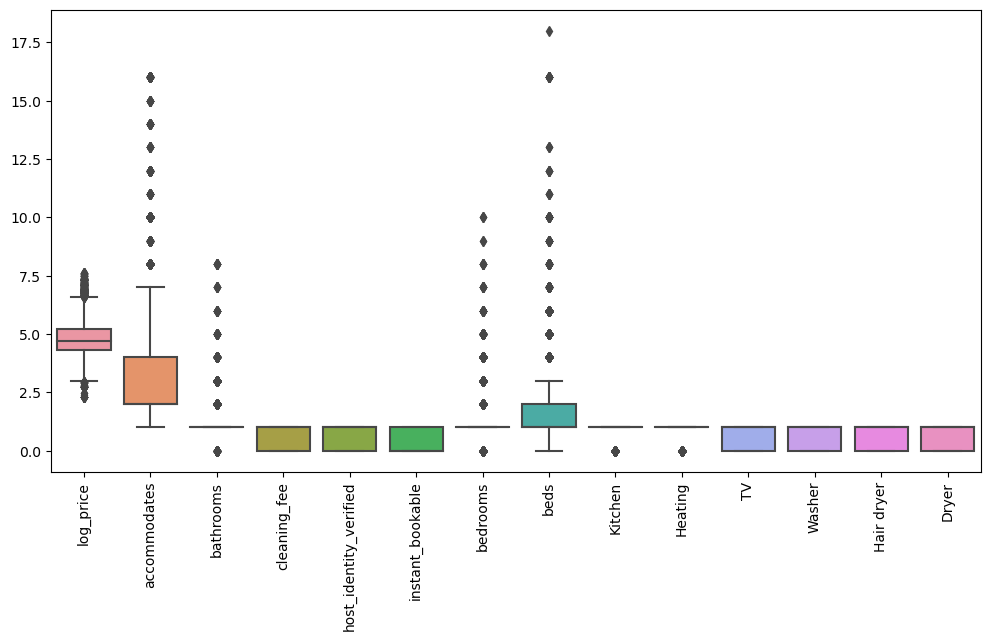

In [45]:
valeurs_normales = ['review_scores_rating','number_of_reviews', 'id', 'latitude', 'longitude']
df_aberrante = airbnb_train.drop(valeurs_normales, axis=1)

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_aberrante)
plt.xticks(rotation=90)
plt.show()

D'après la description les colonnes `bedrooms`, `beds` et `accomodates` contiennent potentiellement des valeurs aberrantes. On va donc filtrer ces colonnes. On considère qu'un lit prend au maximum 2 personnes. On vérifie donc que la colonnes `beds`contient au minimum la valeur de la colonne`accomodates`x 2.

In [46]:
airbnb_train = airbnb_train[(airbnb_train['accommodates'] <= 2 * airbnb_train['beds'])]
airbnb_train.reset_index(drop=True, inplace=True)
airbnb_train

,id,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_since,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,5708593,4.317488,House,Private room,3,1,Real Bed,flexible,False,LA,False,2015-12-12,True,33.782712,-118.134410,Long Beach,0,NaN,0,2,1,0,1,1,1,1
1,14483613,4.007333,House,Private room,4,2,Real Bed,strict,False,NYC,True,2016-11-04,True,40.705468,-73.909439,Ridgewood,38,86.0,1,2,1,1,0,0,1,0
2,17954362,3.555348,House,Private room,1,1,Real Bed,flexible,True,NYC,True,2012-08-04,False,40.736001,-73.924248,Sunnyside,19,96.0,1,1,1,1,1,0,1,0
3,9969781,5.480639,House,Entire home/apt,4,1,Real Bed,moderate,True,SF,True,2013-07-25,False,37.744896,-122.430665,Noe Valley,15,96.0,2,2,1,1,1,1,1,1
4,13113872,6.214608,Apartment,Private room,2,1,Real Bed,moderate,True,NYC,True,2012-11-19,False,40.738580,-74.008752,West Village,0,NaN,1,1,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18591,12684394,4.248495,House,Private room,2,1,Real Bed,moderate,True,LA,True,2015-03-18,False,34.092640,-118.343921,NaN,36,91.0,1,1,1,1,1,1,0,1
18592,11989532,4.605170,Apartment,Private room,1,1,Real Bed,flexible,False,NYC,True,2013-03-24,False,40.709025,-73.939405,Williamsburg,0,NaN,1,1,0,0,0,0,0,0
18593,20652462,5.043425,Apartment,Entire home/apt,4,2,Real Bed,moderate,True,LA,False,2016-05-03,False,33.871549,-118.396053,Hermosa Beach,16,93.0,2,4,1,1,1,1,1,1
18594,19533966,5.273000,Apartment,Entire home/apt,2,1,Real Bed,strict,True,NYC,False,2017-09-17,True,40.738535,-74.000157,West Village,0,NaN,0,2,1,1,1,1,1,1


Maintenant que nous avons préparé les colonnes c-à-d supprimer celles qui sont inutiles et arranger celles qui le sont, nous allons faire notre matrice de corrélation. Pour cela nous allons convertir les données textuelles en information utilisable par un algorithme de machine learning.

In [47]:
to_transform=['property_type','room_type','bed_type','cancellation_policy','city','host_since','neighbourhood']
label_encoder=LabelEncoder()

for el in to_transform:
    airbnb_train[el]=label_encoder.fit_transform(airbnb_train[[el]])

airbnb_train.head(5)

,id,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_since,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,5708593,4.317488,16,1,3,1,4,0,False,3,False,2140,True,33.782712,-118.134410,276,0,NaN,0,2,1,0,1,1,1,1
1,14483613,4.007333,16,1,4,2,4,2,False,4,True,2468,True,40.705468,-73.909439,397,38,86.0,1,2,1,1,0,0,1,0
2,17954362,3.555348,16,1,1,1,4,0,True,4,True,916,False,40.736001,-73.924248,459,19,96.0,1,1,1,1,1,0,1,0
3,9969781,5.480639,16,0,4,1,4,1,True,5,True,1271,False,37.744896,-122.430665,336,15,96.0,2,2,1,1,1,1,1,1
4,13113872,6.214608,0,1,2,1,4,1,True,4,True,1023,False,40.738580,-74.008752,521,0,NaN,1,1,1,1,1,0,0,0


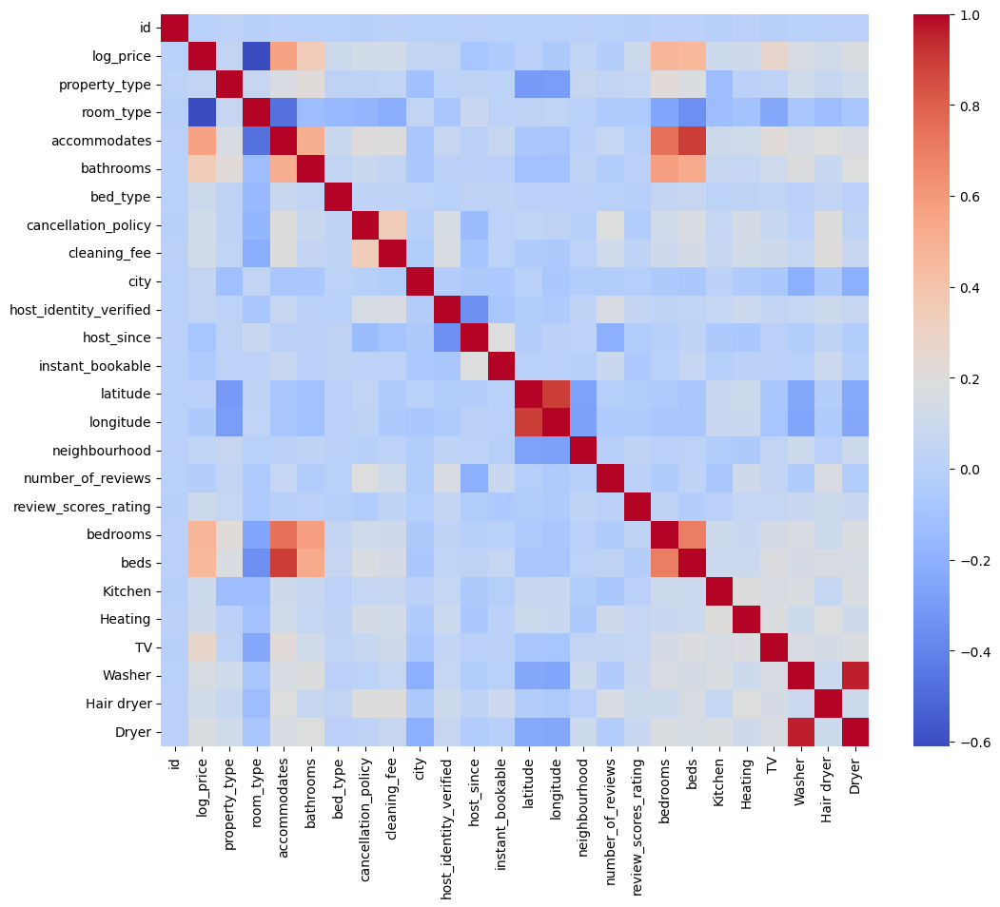

In [48]:
corr_Airbnb = airbnb_train.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_Airbnb, annot=True, fmt=".2f", cmap='coolwarm', annot_kws={"visible": False})
plt.show()

On remarque que la variable `log_price` est corrélée positivement avec  `berooms`, `beds`, `accommodates` et fortement corrélée négativement avec `room_type`. Cette corrélation négative entre `log_price` et le `room_type` s'explique car les logements entiers, offrant plus d'espace, sont généralement plus coûteux que les chambres partagées, ce qui explique que les prix tendent à diminuer lorsque l'on passe d'un logement entier à une chambre partagée.

D'autre part, nous pouvons visualiser la répartition géographique des prix grâce à une carte.

In [49]:
mean_lat = airbnb_train['latitude'].mean()
mean_lon = airbnb_train['longitude'].mean()
airbnb_map = folium.Map(location=[mean_lat, mean_lon], zoom_start = 3)

for idx, row in airbnb_train.iterrows():
    folium.CircleMarker(
        location = [row['latitude'], row['longitude']],
        radius = 5,
        color = 'blue' if row['log_price'] < airbnb_train['log_price'].median() else 'red',
        fill = True,
        fill_color = 'blue' if row['log_price'] < airbnb_train['log_price'].median() else 'red'
    ).add_to(airbnb_map)

airbnb_map

Ici les zones bleues sont moins chères que la médiane et les zones rouges sont plus chères. Avec cette visualisation, nous remarquons que les biens situés sur la côte on tendance à avoir un prix plus élevé que la médiane. Ceci nous indique que la localisation du bien est un facteur important et déterminant dans son prix de location.

Grâce à l'exploration qualitatives des données que nous avons réalisé, nous avons pu détecter quelques variables importantes.

D'abord, après avoir discuté avec l'équipe, nous pensons que les variables `property_type`, `cleaning_fee` sont intéressantes à explorer pour la prédiction du prix. Nous avons volontairement pas vérifié l'impact de ces variables car nous trouvons logiques qu'elles puissent influencer le prix.

Nous avons décidé de ne pas garder la variable `host_identity_verified` car son impact est trop peu significatif.

Ensuite nous avons vu qua la variable `cancellation_policy` avait un impact sur le prix.

D'autre part, dans les équipements, nous avons relevé 6 équipements qui sont importants dans la définition du prix :
`Kitchen`, `Heating`, `TV`, `Washer`, `Hair dryer` et `Dryer`.

Ensuite nous avons réalisé une matrice de corrélation entre plusieurs caractéristiques et nous en avons déduis plusieurs variables importantes dans la définition du prix : `berooms`, `beds`, `accommodates` sont corrélées positivement avec la variable `log_price`, c'est-à-dire que lorsque la valeur de la variable augmente, le `log_price` tend également à augmenter. Il y a aussi la variable `room-type` qui elle est corrélée négativement avec `log_price`.

De plus, grâce à la carte que nous avons affiché, nous voyons que la localisation (`city`) du airbnb compte également beaucoup dans le prix (les zones rouges sont souvent aux mêmes endroits et les zones bleues aussi).

#### D'apès notre étude, le choix final des variables que nous allons utiliser pour prédire le prix est :

In [50]:
rm = ['bathrooms','bed_type','host_identity_verified','host_since','instant_bookable','latitude','longitude', 'neighbourhood', 'number_of_reviews', 'review_scores_rating']
airbnb_train.drop(rm , axis = 1, inplace = True)

In [51]:
airbnb_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18596 entries, 0 to 18595
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   18596 non-null  int64  
 1   log_price            18596 non-null  float64
 2   property_type        18596 non-null  int64  
 3   room_type            18596 non-null  int64  
 4   accommodates         18596 non-null  int64  
 5   cancellation_policy  18596 non-null  int64  
 6   cleaning_fee         18596 non-null  bool   
 7   city                 18596 non-null  int64  
 8   bedrooms             18596 non-null  int64  
 9   beds                 18596 non-null  int64  
 10  Kitchen              18596 non-null  int64  
 11  Heating              18596 non-null  int64  
 12  TV                   18596 non-null  int64  
 13  Washer               18596 non-null  int64  
 14  Hair dryer           18596 non-null  int64  
 15  Dryer                18596 non-null 

Maintenant que nous avons sélectionné différentes variables grâce à diverses méthodes (graphique, logique, analyse des données) nous allons appliquer des modèles différents pour prédire le prix des Airbnb.

### airbnb_test

Pour pouvoir utiliser des algorithmes de machine learning avec 2 datasets, nous devons avoir des datasets similaires. Ainsi, nous allons effectuer le même traitement sur nos 2 fichiers.

In [52]:
airbnb_test.head()

,Unnamed: 0,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,14282777,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,NYC,"Beautiful, sunlit brownstone 1-bedroom in the ...",2016-06-18,t,t,NaN,2012-03-26,f,2016-07-18,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,11201,1.0,1.0
1,17029381,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,NYC,Enjoy travelling during your stay in Manhattan...,2017-08-05,t,f,100%,2017-06-19,t,2017-09-23,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,10019,3.0,3.0
2,7824740,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,NYC,The Oasis comes complete with a full backyard ...,2017-04-30,t,t,100%,2016-10-25,t,2017-09-14,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,10027,1.0,3.0
3,19811650,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,SF,This light-filled home-away-from-home is super...,NaN,t,t,NaN,2015-04-19,f,NaN,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,94117.0,2.0,2.0
4,12410741,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,DC,"Cool, cozy, and comfortable studio located in ...",2015-05-12,t,t,100%,2015-03-01,t,2017-01-22,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,20009,0.0,1.0


In [53]:
airbnb_test.tail()

,Unnamed: 0,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
51872,14844128,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1.0,Real Bed,flexible,False,LA,City of Glendale is located in the middle of e...,NaN,t,t,NaN,2011-08-02,f,NaN,34.156056,-118.235445,Lovely home in a Great City,Glendale,0,NaN,91206,1.0,1.0
51873,16051971,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1.0,Real Bed,moderate,True,NYC,This jewel box is perched on the top floor of ...,2016-06-15,t,f,100%,2016-04-20,f,2017-08-20,40.765323,-73.961502,"Penthouse 2BR w skylight,terrace, and a roof d...",Upper East Side,22,98.0,10065,2.0,3.0
51874,16429629,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",3,1.0,Real Bed,strict,True,NYC,This is a beautiful and spacious apartment in ...,2017-07-17,t,f,36%,2017-07-10,f,2017-09-24,40.770700,-73.963228,Comfy UES apt close to Central Park!,Upper East Side,3,73.0,10021,0.0,2.0
51875,324969,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,moderate,True,LA,"Rent a wonderful, expansive room in our comfor...",2011-07-05,t,t,100%,2011-06-13,f,2017-03-25,34.099417,-118.276401,"Cozy room1; Silverlake, Los Angeles",Los Feliz,69,96.0,90039,1.0,2.0
51876,9684189,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",Kitchen,Gym...",3,1.0,Real Bed,flexible,True,SF,"A lovely, new high rise development at 8th and...",NaN,f,f,NaN,2015-04-09,f,NaN,37.777291,-122.412377,Beautiful & New Jr 1BD-,SoMa,0,NaN,94103,0.0,1.0


In [54]:
airbnb_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51877 entries, 0 to 51876
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              51877 non-null  int64  
 1   property_type           51877 non-null  object 
 2   room_type               51877 non-null  object 
 3   amenities               51877 non-null  object 
 4   accommodates            51877 non-null  int64  
 5   bathrooms               51728 non-null  float64
 6   bed_type                51877 non-null  object 
 7   cancellation_policy     51877 non-null  object 
 8   cleaning_fee            51877 non-null  bool   
 9   city                    51877 non-null  object 
 10  description             51877 non-null  object 
 11  first_review            40738 non-null  object 
 12  host_has_profile_pic    51745 non-null  object 
 13  host_identity_verified  51745 non-null  object 
 14  host_response_rate      39053 non-null

On voit que la première colonne n'a pas de nom et correspond surement à l'ID du logement. Les remarques concernants le reste des données restent les mêmes qu'au dessus. On va donc modifier le nom de la première colonne :

In [55]:
airbnb_test = airbnb_test.rename(columns={airbnb_test.columns[0]: "id"})

Nous allons appliquer les mêmes changements.

In [56]:
airbnb_test.describe()

,id,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
count,5.187700e+04,51877.000000,51728.000000,51877.000000,51877.000000,51877.000000,40133.000000,51812.000000,51781.000000
mean,1.128544e+07,3.154963,1.234931,38.438667,-92.452479,20.999055,94.066628,1.266232,1.710608
std,6.082234e+06,2.157761,0.580238,3.083798,21.720385,38.101633,7.859894,0.851862,1.253827
min,3.440000e+02,1.000000,0.000000,33.338905,-122.511500,0.000000,20.000000,0.000000,0.000000
25%,6.283933e+06,2.000000,1.000000,34.123948,-118.343022,1.000000,92.000000,1.000000,1.000000
50%,1.229089e+07,2.000000,1.000000,40.661996,-76.997857,6.000000,96.000000,1.000000,1.000000
75%,1.640509e+07,4.000000,1.000000,40.745981,-73.954670,24.000000,100.000000,1.000000,2.000000
max,2.123090e+07,16.000000,8.000000,42.390437,-70.985047,605.000000,100.000000,10.000000,16.000000


Nous remarquons que certaines valeurs sont à 0 (par exemple : `bedrooms`) ce qui signifie que certains logements n'ont pas de chambre.

In [57]:
airbnb_test.isna().sum()

id                            0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                   149
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review              11139
host_has_profile_pic        132
host_identity_verified      132
host_response_rate        12824
host_since                  132
instant_bookable              0
last_review               11111
latitude                      0
longitude                     0
name                          0
neighbourhood              4786
number_of_reviews             0
review_scores_rating      11744
zipcode                     663
bedrooms                     65
beds                         96
dtype: int64

Nous voyons qu'il y a beaucoup de données manquantes. On remarque que les colonnes `first_review`, `host_response_rate` `review_scores_rating` ont beaucoup de valeurs manquantes ce qui peut être normal. Donc nous n'allons pas modifier ces valeurs. En revanche, nous pensons les colonnes avec un nombre faible de valeurs manquantes sont anormales, nous alons donc supprimer les lignes. 

In [58]:
col_test = ['bathrooms', 'host_has_profile_pic', 'host_has_profile_pic', 'host_since', 'zipcode','bedrooms', 'beds']
airbnb_test.dropna(subset = col_test, inplace = True)

In [59]:
airbnb_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50847 entries, 0 to 51876
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      50847 non-null  int64  
 1   property_type           50847 non-null  object 
 2   room_type               50847 non-null  object 
 3   amenities               50847 non-null  object 
 4   accommodates            50847 non-null  int64  
 5   bathrooms               50847 non-null  float64
 6   bed_type                50847 non-null  object 
 7   cancellation_policy     50847 non-null  object 
 8   cleaning_fee            50847 non-null  bool   
 9   city                    50847 non-null  object 
 10  description             50847 non-null  object 
 11  first_review            39983 non-null  object 
 12  host_has_profile_pic    50847 non-null  object 
 13  host_identity_verified  50847 non-null  object 
 14  host_response_rate      38427 non-null  obj

On remarque que certaines colonnes contiennent des données de type float (ex : `bathrooms`, `bedrooms`), ce qui n'est pas justifié. Des valeurs entières seraient plus pertinentes. Mêmes remarques pour les colonnes `first_review` et `last_review`. On va donc changer le typage des données.

In [60]:
airbnb_test['bathrooms'] = airbnb_test['bathrooms'].astype(int)
airbnb_test['bedrooms'] = airbnb_test['bedrooms'].astype(int)
airbnb_test['beds'] = airbnb_test['beds'].astype(int)

In [61]:
airbnb_test['first_review'] = pd.to_datetime(airbnb_test['first_review'], format='%Y-%m-%d')
airbnb_test['last_review'] = pd.to_datetime(airbnb_test['last_review'], format='%Y-%m-%d')

In [62]:
airbnb_test['host_has_profile_pic'] = np.where(airbnb_test['host_has_profile_pic'] == 't', True, False)
airbnb_test['host_identity_verified'] = np.where(airbnb_test['host_identity_verified'] == 't', True, False)
airbnb_test['instant_bookable'] = np.where(airbnb_test['instant_bookable'] == 't', True, False)

In [63]:
airbnb_test.head()

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,14282777,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1,Real Bed,strict,True,NYC,"Beautiful, sunlit brownstone 1-bedroom in the ...",2016-06-18,True,True,NaN,2012-03-26,False,2016-07-18,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,11201,1,1
1,17029381,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1,Real Bed,strict,True,NYC,Enjoy travelling during your stay in Manhattan...,2017-08-05,True,False,100%,2017-06-19,True,2017-09-23,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,10019,3,3
2,7824740,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1,Real Bed,moderate,True,NYC,The Oasis comes complete with a full backyard ...,2017-04-30,True,True,100%,2016-10-25,True,2017-09-14,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,10027,1,3
3,19811650,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,flexible,True,SF,This light-filled home-away-from-home is super...,NaT,True,True,NaN,2015-04-19,False,NaT,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,94117.0,2,2
4,12410741,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1,Real Bed,moderate,True,DC,"Cool, cozy, and comfortable studio located in ...",2015-05-12,True,True,100%,2015-03-01,True,2017-01-22,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,20009,0,1


In [64]:
airbnb_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50847 entries, 0 to 51876
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      50847 non-null  int64         
 1   property_type           50847 non-null  object        
 2   room_type               50847 non-null  object        
 3   amenities               50847 non-null  object        
 4   accommodates            50847 non-null  int64         
 5   bathrooms               50847 non-null  int64         
 6   bed_type                50847 non-null  object        
 7   cancellation_policy     50847 non-null  object        
 8   cleaning_fee            50847 non-null  bool          
 9   city                    50847 non-null  object        
 10  description             50847 non-null  object        
 11  first_review            39983 non-null  datetime64[ns]
 12  host_has_profile_pic    50847 non-null  bool       

In [65]:
airbnb_test.duplicated().sum()

0

On voit qu'il n'y a aucun doublon.

In [66]:
airbnb_test.shape

(50847, 27)

Appliquons les mêmes modifications.

In [67]:
airbnb_amenities_test = airbnb_test[['amenities']].copy()

In [68]:
airbnb_amenities_test

,amenities
0,"{""Wireless Internet"",""Air conditioning"",Kitche..."
1,"{""Wireless Internet"",""Air conditioning"",Kitche..."
2,"{TV,""Cable TV"",""Wireless Internet"",""Air condit..."
3,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki..."
4,"{TV,Internet,""Wireless Internet"",""Air conditio..."
...,...
51872,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A..."
51873,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A..."
51874,"{TV,""Wireless Internet"",""Air conditioning"",Kit..."
51875,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki..."


In [69]:
airbnb_amenities_test['amenities'] = airbnb_amenities_test['amenities'].astype(str)

airbnb_amenities_test['amenities'] = airbnb_amenities_test['amenities'].str.replace(r'[{}"]', '', regex=True)

amenities_encoded_test = airbnb_amenities_test['amenities'].str.get_dummies(',')

airbnb_amenities_test = pd.concat([airbnb_amenities_test, amenities_encoded_test], axis=1)

airbnb_amenities_test

,amenities,smooth pathway to front door,24-hour check-in,Accessible-height bed,Accessible-height toilet,Air conditioning,Air purifier,BBQ grill,Baby bath,Baby monitor,Babysitter recommendations,Bath towel,Bathtub,Bathtub with shower chair,Beach essentials,Beachfront,Bed linens,Body soap,Breakfast,Buzzer/wireless intercom,Cable TV,Carbon monoxide detector,Cat(s),Changing table,Children’s books and toys,Children’s dinnerware,Cleaning before checkout,Coffee maker,Cooking basics,Crib,Disabled parking spot,Dishes and silverware,Dishwasher,Dog(s),Doorman,Doorman Entry,Dryer,EV charger,Elevator,Elevator in building,Essentials,Ethernet connection,Extra pillows and blankets,Family/kid friendly,Fire extinguisher,Fireplace guards,Firm matress,Firm mattress,First aid kit,Fixed grab bars for shower & toilet,Flat,Flat smooth pathway to front door,Free parking on premises,Free parking on street,Game console,Garden or backyard,Grab-rails for shower and toilet,Ground floor access,Gym,Hair dryer,Hand or paper towel,Hand soap,Handheld shower head,Hangers,Heating,High chair,Host greets you,Hot tub,Hot water,Hot water kettle,Indoor fireplace,Internet,Iron,Keypad,Kitchen,Lake access,Laptop friendly workspace,Lock on bedroom door,Lockbox,Long term stays allowed,Luggage dropoff allowed,Microwave,Other,Other pet(s),Outlet covers,Oven,Pack ’n Play/travel crib,Paid parking off premises,Path to entrance lit at night,Patio or balcony,Pets allowed,Pets live on this property,Pocket wifi,Pool,Private bathroom,Private entrance,Private living room,Refrigerator,Roll-in shower with chair,Room-darkening shades,Safety card,Self Check-In,Shampoo,Single level home,Ski in/Ski out,Smart lock,Smartlock,Smoke detector,Smoking allowed,Stair gates,Step-free access,Stove,Suitable for events,TV,Table corner guards,Toilet paper,Washer,Washer / Dryer,Waterfront,Well-lit path to entrance,Wheelchair accessible,Wide clearance to bed,Wide clearance to shower & toilet,Wide clearance to shower and toilet,Wide doorway,Wide entryway,Wide hallway clearance,Window guards,Wireless Internet,translation missing: en.hosting_amenity_49,translation missing: en.hosting_amenity_50
0,"Wireless Internet,Air conditioning,Kitchen,Hea...",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,"Wireless Internet,Air conditioning,Kitchen,Hea...",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,"TV,Cable TV,Wireless Internet,Air conditioning...",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,"TV,Cable TV,Internet,Wireless Internet,Kitchen...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,"TV,Internet,Wireless Internet,Air conditioning...",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [70]:
airbnb_test

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,14282777,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1,Real Bed,strict,True,NYC,"Beautiful, sunlit brownstone 1-bedroom in the ...",2016-06-18,True,True,NaN,2012-03-26,False,2016-07-18,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,11201,1,1
1,17029381,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1,Real Bed,strict,True,NYC,Enjoy travelling during your stay in Manhattan...,2017-08-05,True,False,100%,2017-06-19,True,2017-09-23,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,10019,3,3
2,7824740,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1,Real Bed,moderate,True,NYC,The Oasis comes complete with a full backyard ...,2017-04-30,True,True,100%,2016-10-25,True,2017-09-14,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,10027,1,3
3,19811650,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,flexible,True,SF,This light-filled home-away-from-home is super...,NaT,True,True,NaN,2015-04-19,False,NaT,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,94117.0,2,2
4,12410741,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1,Real Bed,moderate,True,DC,"Cool, cozy, and comfortable studio located in ...",2015-05-12,True,True,100%,2015-03-01,True,2017-01-22,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,20009,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51872,14844128,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1,Real Bed,flexible,False,LA,City of Glendale is located in the middle of e...,NaT,True,True,NaN,2011-08-02,False,NaT,34.156056,-118.235445,Lovely home in a Great City,Glendale,0,NaN,91206,1,1
51873,16051971,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1,Real Bed,moderate,True,NYC,This jewel box is perched on the top floor of ...,2016-06-15,True,False,100%,2016-04-20,False,2017-08-20,40.765323,-73.961502,"Penthouse 2BR w skylight,terrace, and a roof d...",Upper East Side,22,98.0,10065,2,3
51874,16429629,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",3,1,Real Bed,strict,True,NYC,This is a beautiful and spacious apartment in ...,2017-07-17,True,False,36%,2017-07-10,False,2017-09-24,40.770700,-73.963228,Comfy UES apt close to Central Park!,Upper East Side,3,73.0,10021,0,2
51875,324969,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,moderate,True,LA,"Rent a wonderful, expansive room in our comfor...",2011-07-05,True,True,100%,2011-06-13,False,2017-03-25,34.099417,-118.276401,"Cozy room1; Silverlake, Los Angeles",Los Feliz,69,96.0,90039,1,2


In [71]:
airbnb_test = pd.concat([airbnb_test, amenities_encoded_test[amenities]], axis = 1)
airbnb_test

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,14282777,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1,Real Bed,strict,True,NYC,"Beautiful, sunlit brownstone 1-bedroom in the ...",2016-06-18,True,True,NaN,2012-03-26,False,2016-07-18,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,11201,1,1,1,1,0,0,1,0
1,17029381,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1,Real Bed,strict,True,NYC,Enjoy travelling during your stay in Manhattan...,2017-08-05,True,False,100%,2017-06-19,True,2017-09-23,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,10019,3,3,1,1,0,1,1,1
2,7824740,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1,Real Bed,moderate,True,NYC,The Oasis comes complete with a full backyard ...,2017-04-30,True,True,100%,2016-10-25,True,2017-09-14,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,10027,1,3,1,1,1,0,1,0
3,19811650,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,flexible,True,SF,This light-filled home-away-from-home is super...,NaT,True,True,NaN,2015-04-19,False,NaT,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,94117.0,2,2,1,1,1,1,0,1
4,12410741,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1,Real Bed,moderate,True,DC,"Cool, cozy, and comfortable studio located in ...",2015-05-12,True,True,100%,2015-03-01,True,2017-01-22,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,20009,0,1,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51872,14844128,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1,Real Bed,flexible,False,LA,City of Glendale is located in the middle of e...,NaT,True,True,NaN,2011-08-02,False,NaT,34.156056,-118.235445,Lovely home in a Great City,Glendale,0,NaN,91206,1,1,1,1,1,1,0,1
51873,16051971,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1,Real Bed,moderate,True,NYC,This jewel box is perched on the top floor of ...,2016-06-15,True,False,100%,2016-04-20,False,2017-08-20,40.765323,-73.961502,"Penthouse 2BR w skylight,terrace, and a roof d...",Upper East Side,22,98.0,10065,2,3,1,1,1,1,1,1
51874,16429629,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",3,1,Real Bed,strict,True,NYC,This is a beautiful and spacious apartment in ...,2017-07-17,True,False,36%,2017-07-10,False,2017-09-24,40.770700,-73.963228,Comfy UES apt close to Central Park!,Upper East Side,3,73.0,10021,0,2,1,1,1,0,1,0
51875,324969,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1,Real Bed,moderate,True,LA,"Rent a wonderful, expansive room in our comfor...",2011-07-05,True,True,100%,2011-06-13,False,2017-03-25,34.099417,-118.276401,"Cozy room1; Silverlake, Los Angeles",Los Feliz,69,96.0,90039,1,2,1,1,1,1,0,1


In [72]:
nom_suppr_test = ["amenities", "description", "first_review", "host_has_profile_pic", "host_response_rate", "last_review", "name", "zipcode"]
airbnb_test.drop(nom_suppr_test, axis = 1, inplace = True)

In [73]:
airbnb_test

,id,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_since,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,14282777,Apartment,Entire home/apt,3,1,Real Bed,strict,True,NYC,True,2012-03-26,False,40.696524,-73.991617,Brooklyn Heights,2,100.0,1,1,1,1,0,0,1,0
1,17029381,Apartment,Entire home/apt,7,1,Real Bed,strict,True,NYC,False,2017-06-19,True,40.766115,-73.989040,Hell's Kitchen,6,93.0,3,3,1,1,0,1,1,1
2,7824740,Apartment,Entire home/apt,5,1,Real Bed,moderate,True,NYC,True,2016-10-25,True,40.808110,-73.943756,Harlem,10,92.0,1,3,1,1,1,0,1,0
3,19811650,House,Entire home/apt,4,1,Real Bed,flexible,True,SF,True,2015-04-19,False,37.772004,-122.431619,Lower Haight,0,NaN,2,2,1,1,1,1,0,1
4,12410741,Apartment,Entire home/apt,2,1,Real Bed,moderate,True,DC,True,2015-03-01,True,38.925627,-77.034596,Columbia Heights,4,40.0,0,1,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51872,14844128,House,Entire home/apt,4,1,Real Bed,flexible,False,LA,True,2011-08-02,False,34.156056,-118.235445,Glendale,0,NaN,1,1,1,1,1,1,0,1
51873,16051971,House,Entire home/apt,4,1,Real Bed,moderate,True,NYC,False,2016-04-20,False,40.765323,-73.961502,Upper East Side,22,98.0,2,3,1,1,1,1,1,1
51874,16429629,Apartment,Entire home/apt,3,1,Real Bed,strict,True,NYC,False,2017-07-10,False,40.770700,-73.963228,Upper East Side,3,73.0,0,2,1,1,1,0,1,0
51875,324969,House,Private room,4,1,Real Bed,moderate,True,LA,True,2011-06-13,False,34.099417,-118.276401,Los Feliz,69,96.0,1,2,1,1,1,1,0,1


On enlève les valeurs aberrantes : 

In [74]:
airbnb_test = airbnb_test[(airbnb_test['accommodates'] <= 2 * airbnb_test['beds'])]
airbnb_test.reset_index(drop=True, inplace=True)
airbnb_test

,id,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_since,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,7824740,Apartment,Entire home/apt,5,1,Real Bed,moderate,True,NYC,True,2016-10-25,True,40.808110,-73.943756,Harlem,10,92.0,1,3,1,1,1,0,1,0
1,19811650,House,Entire home/apt,4,1,Real Bed,flexible,True,SF,True,2015-04-19,False,37.772004,-122.431619,Lower Haight,0,NaN,2,2,1,1,1,1,0,1
2,12410741,Apartment,Entire home/apt,2,1,Real Bed,moderate,True,DC,True,2015-03-01,True,38.925627,-77.034596,Columbia Heights,4,40.0,0,1,1,1,1,0,0,0
3,19589738,Apartment,Private room,2,1,Real Bed,strict,True,SF,True,2017-06-07,True,37.753164,-122.429526,Noe Valley,3,100.0,1,1,0,1,1,0,0,0
4,6128434,Condominium,Entire home/apt,2,1,Real Bed,moderate,True,LA,True,2013-05-18,False,34.046737,-118.260439,Downtown,9,93.0,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43566,16143229,Apartment,Entire home/apt,2,1,Real Bed,strict,True,NYC,True,2011-08-24,True,40.701156,-73.927333,Bushwick,61,98.0,1,1,0,1,1,0,1,0
43567,6976826,House,Private room,8,1,Real Bed,strict,True,NYC,True,2011-10-20,True,40.714595,-73.947343,Williamsburg,0,NaN,3,6,1,1,0,0,1,0
43568,16051971,House,Entire home/apt,4,1,Real Bed,moderate,True,NYC,False,2016-04-20,False,40.765323,-73.961502,Upper East Side,22,98.0,2,3,1,1,1,1,1,1
43569,16429629,Apartment,Entire home/apt,3,1,Real Bed,strict,True,NYC,False,2017-07-10,False,40.770700,-73.963228,Upper East Side,3,73.0,0,2,1,1,1,0,1,0


#### D'apès notre étude, le choix final des variables que nous allons utiliser pour prédire le prix est :

In [75]:
rm = ['bathrooms','bed_type','host_identity_verified','host_since','instant_bookable','latitude','longitude', 'neighbourhood', 'number_of_reviews', 'review_scores_rating']
airbnb_test.drop(rm , axis = 1, inplace = True)

In [76]:
airbnb_test

,id,property_type,room_type,accommodates,cancellation_policy,cleaning_fee,city,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,7824740,Apartment,Entire home/apt,5,moderate,True,NYC,1,3,1,1,1,0,1,0
1,19811650,House,Entire home/apt,4,flexible,True,SF,2,2,1,1,1,1,0,1
2,12410741,Apartment,Entire home/apt,2,moderate,True,DC,0,1,1,1,1,0,0,0
3,19589738,Apartment,Private room,2,strict,True,SF,1,1,0,1,1,0,0,0
4,6128434,Condominium,Entire home/apt,2,moderate,True,LA,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43566,16143229,Apartment,Entire home/apt,2,strict,True,NYC,1,1,0,1,1,0,1,0
43567,6976826,House,Private room,8,strict,True,NYC,3,6,1,1,0,0,1,0
43568,16051971,House,Entire home/apt,4,moderate,True,NYC,2,3,1,1,1,1,1,1
43569,16429629,Apartment,Entire home/apt,3,strict,True,NYC,0,2,1,1,1,0,1,0


In [77]:
to_transform_test=['property_type','room_type','cancellation_policy','city']
label_encoder_test=LabelEncoder()

for el in to_transform_test:
    airbnb_test[el]=label_encoder_test.fit_transform(airbnb_test[[el]])

airbnb_test.head(5)

,id,property_type,room_type,accommodates,cancellation_policy,cleaning_fee,city,bedrooms,beds,Kitchen,Heating,TV,Washer,Hair dryer,Dryer
0,7824740,0,0,5,1,True,4,1,3,1,1,1,0,1,0
1,19811650,17,0,4,0,True,5,2,2,1,1,1,1,0,1
2,12410741,0,0,2,1,True,2,0,1,1,1,1,0,0,0
3,19589738,0,1,2,2,True,5,1,1,0,1,1,0,0,0
4,6128434,11,0,2,1,True,3,1,1,1,1,1,1,1,1


Nos 2 dataframes sont prêts pour les algorithmes de machine learning.

## Partie prédiction

Nous avons effectué un nettoyage et un pré-traitement sur nos deux datasets afin de pouvoir les utiliser correctement avec nos modèles de prédiction.

### Analyse en composantes principales

Grâce à la matrice de correlation, nous avons pu constater avant, que des correlations entre des variables ne sont pas très forts, et celles, qui sont fortement correlées ne sont pas nombreuses relativement au nombre total des variables rétenues. Cela suggère une absence ou la présence faible de la multicollinearité, dont la présence pourrait justifier l'application de l'ACP. <br>
Néanmoins, à cause de la taille de données, l'ACP peut s'averer utile dans notre cas.

On commence par la standardisation des données d'entrainement, notamment des variables predicteur. On inclue toutes les variables rétenues auparavant pour l'ACP.

In [78]:
airbnb_train_X = airbnb_train.drop(columns=['log_price', 'id'])
airbnb_train_Y = airbnb_train['log_price']

In [79]:
scaler = StandardScaler()
airbnb_train_X_scaled = scaler.fit_transform(airbnb_train_X)

Vérification de la variance expliquée et la proportion de la variance cumulée (c'est-à-dire chaque prochaine valeur inclue dans la variance des variables precédantes) pour une meuilleure choix de nombre de variables prédicteurs (pour la regression lineaire multiple):

In [80]:
pca = PCA()
X_train_pca = pca.fit_transform(airbnb_train_X_scaled)
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

In [81]:
print(cumulative_variance)

[0.24398775 0.3794488  0.48674715 0.57288859 0.64250092 0.70881646
 0.76918711 0.82541947 0.87656041 0.92422317 0.96818944 0.99049804
 0.9969216  1.        ]


In [82]:
print(explained_variance)

[0.24398775 0.13546105 0.10729835 0.08614144 0.06961232 0.06631554
 0.06037065 0.05623236 0.05114094 0.04766276 0.04396627 0.0223086
 0.00642356 0.0030784 ]


#### Visualisation des résultats :

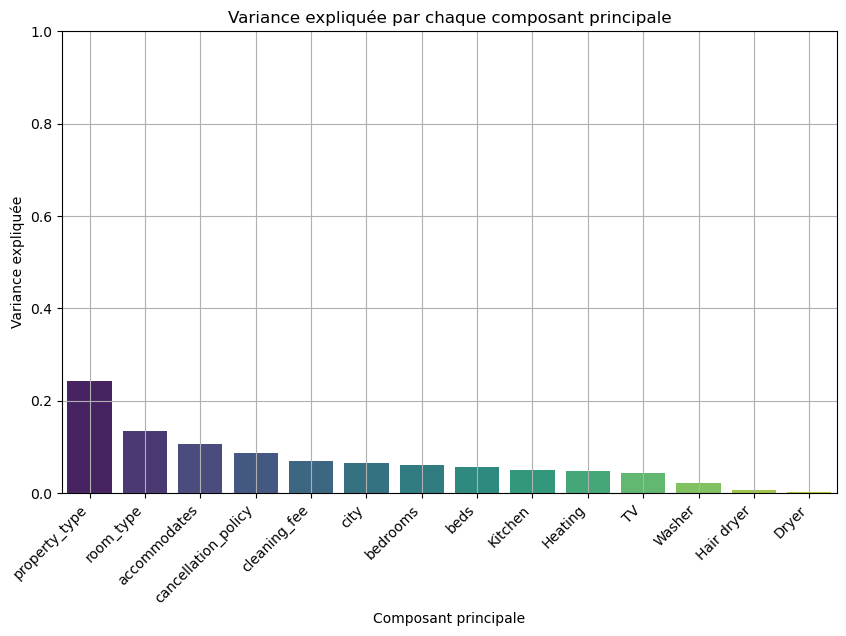

In [83]:
column_names = airbnb_train_X.columns
pca_df = pd.DataFrame({
    'Composant principale': [f'{column_names[i]}' for i in range(len(explained_variance))],
    'Variance expliquée': explained_variance
})

plt.figure(figsize=(10, 6))
sns.barplot(x='Composant principale', y='Variance expliquée', data=pca_df, palette='viridis')
plt.title('Variance expliquée par chaque composant principale')
plt.xlabel('Composant principale')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Variance expliquée')
plt.ylim(0, 1)
plt.grid(True)
plt.show()


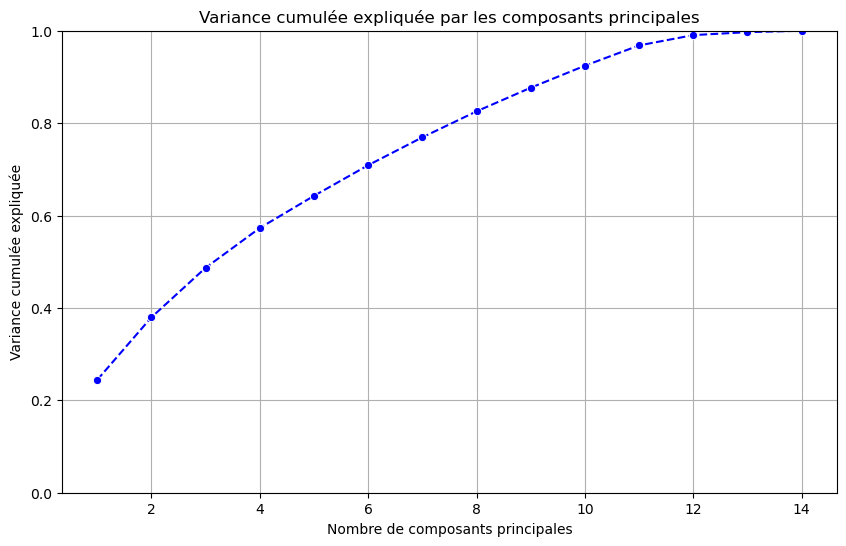

In [84]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=range(1, len(cumulative_variance) + 1), y=cumulative_variance, marker='o', linestyle='--', color='b')
plt.title('Variance cumulée expliquée par les composants principales')
plt.xlabel('Nombre de composants principales')
plt.ylabel('Variance cumulée expliquée')
plt.ylim(0, 1)
plt.grid(True)
plt.show()

Nous allons commencer avec la variance d'environ 95%, afin de vérifier les résultats et eventuellement changer et comparer en fonction de celles-ci.<br>
On garde les premieres 11 variables, alors on vire `Washer`, `Hair dryer` et `Dryer`.

#### Regression lineaire multiple

L'approche qu'on appliquera ici, serait de partir d'abord avec toutes les 14 variables obtenues avant l'application de la PCA et enlever certaines charactèristiques au fur et à mésure avec des itérations suivantes.

**Première itération**

In [85]:
airbnb_train_X = airbnb_train.drop(columns=['log_price', 'id'])
airbnb_train_Y = airbnb_train['log_price']

In [86]:
reg=linear_model.LinearRegression()

In [87]:
X_train, X_test, Y_train, Y_test = train_test_split(airbnb_train_X, airbnb_train_Y, test_size=0.2)

In [88]:
reg.fit(X_train, Y_train)

LinearRegression()

In [89]:
predictions_y=reg.predict(X_test)

In [90]:
mae_1 = mean_absolute_error(predictions_y, Y_test)
mse_1 = mean_squared_error(predictions_y, Y_test)
r2_1 = r2_score(Y_test, predictions_y)

print("Mean Absolute Error:", mae_1)
print("Mean Squared Error:", mse_1)
print("R2 score:", r2_1)

Mean Absolute Error: 0.37533345008403557
Mean Squared Error: 0.24610739908630178
R2 score: 0.5099881146315333


**Deuxième itération**

In [91]:
airbnb_train_X = airbnb_train.drop(columns=['log_price', 'id', 'Washer', 'Hair dryer', 'Dryer'])

In [92]:
X_train, X_test, Y_train, Y_test = train_test_split(airbnb_train_X, airbnb_train_Y, test_size=0.2)

In [93]:
reg.fit(X_train, Y_train)

LinearRegression()

In [94]:
predictions_y=reg.predict(X_test)

In [95]:
mae_2 = mean_absolute_error(predictions_y, Y_test)
mse_2 = mean_squared_error(predictions_y, Y_test)
r2_2 = r2_score(Y_test, predictions_y)

print("Mean Absolute Error:", mae_2)
print("Mean Squared Error:", mse_2)
print("R2 score:", r2_2)

Mean Absolute Error: 0.37222675268719074
Mean Squared Error: 0.2505037102427055
R2 score: 0.4967044918358242


**Troisième itération**

In [96]:
airbnb_train_X = airbnb_train.drop(columns=['log_price', 'id', 'Washer', 'Hair dryer', 'Dryer', 'TV'])

In [97]:
X_train, X_test, Y_train, Y_test = train_test_split(airbnb_train_X, airbnb_train_Y, test_size=0.2)

In [98]:
reg.fit(X_train, Y_train)

LinearRegression()

In [99]:
predictions_y=reg.predict(X_test)

In [100]:
mae_3 = mean_absolute_error(predictions_y, Y_test)
mse_3 = mean_squared_error(predictions_y, Y_test)
r2_3 = r2_score(Y_test, predictions_y)

print("Mean Absolute Error:", mae_3)
print("Mean Squared Error:", mse_3)
print("R2 score:", r2_3)

Mean Absolute Error: 0.36974422518762856
Mean Squared Error: 0.23897380214277483
R2 score: 0.5115008315642674


**Quatrième itération**

In [101]:
airbnb_train_X = airbnb_train.drop(columns=['log_price', 'id', 'beds', 'Kitchen', 'Heating', 'TV', 'Washer', 'Hair dryer', 'Dryer', 'TV'])
airbnb_train_Y = airbnb_train['log_price']

In [102]:
X_train, X_test, Y_train, Y_test = train_test_split(airbnb_train_X, airbnb_train_Y, test_size=0.2)

In [103]:
reg.fit(X_train, Y_train)

LinearRegression()

In [104]:
predictions_y=reg.predict(X_test)

In [105]:
mae_4 = mean_absolute_error(predictions_y, Y_test)
mse_4 = mean_squared_error(predictions_y, Y_test)
r2_4 = r2_score(Y_test, predictions_y)

print("Mean Absolute Error:", mae_4)
print("Mean Squared Error:", mse_4)
print("R2 score:", r2_4)

Mean Absolute Error: 0.369944767558642
Mean Squared Error: 0.24129917349023838
R2 score: 0.5179100864171577


#### L'évolution entre différentes itérations - comparatif visuel

In [106]:
r2_results=[r2_1,r2_2,r2_3,r2_4]
mae_results=[mae_1, mae_2, mae_3, mae_4]
mse_results=[mse_1, mse_2, mse_3, mse_4]
iterations=[1,2,3,4]

In [107]:
iterations_df = pd.DataFrame({
    'Iteration': iterations,
    'MAE': mae_results,
    'MSE': mse_results,
    'R2': r2_results
})

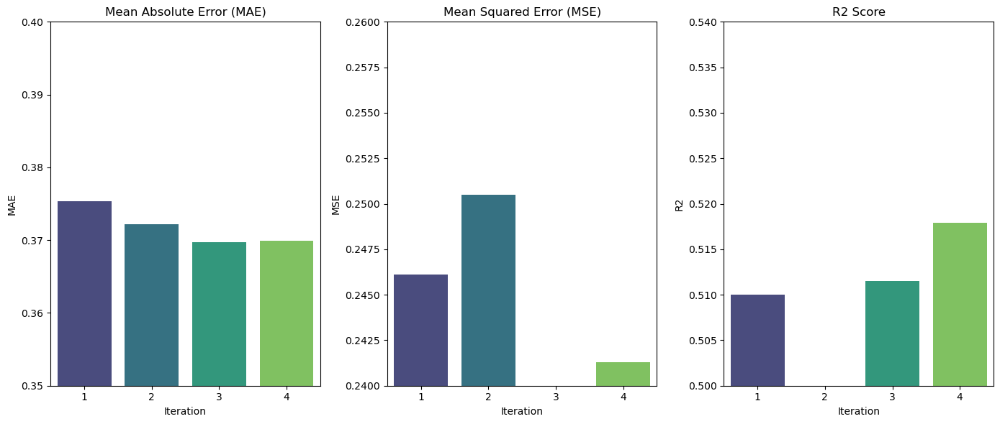

In [108]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
sns.barplot(x='Iteration', y='MAE', data=iterations_df, palette='viridis')
plt.title('Mean Absolute Error (MAE)')
plt.ylim(0.35, 0.40)

plt.subplot(1, 3, 2)
sns.barplot(x='Iteration', y='MSE', data=iterations_df, palette='viridis')
plt.title('Mean Squared Error (MSE)')
plt.ylim(0.24, 0.26)

plt.subplot(1, 3, 3)
sns.barplot(x='Iteration', y='R2', data=iterations_df, palette='viridis')
plt.title('R2 Score')
plt.ylim(0.50, 0.54)

plt.tight_layout()
plt.show()

#### Des constats finals par rapport aux résultats :

* La suppression de certaines variables telles que `Washer`, `Hair dryer`, `Dryer` ou encore `TV` impacte d'une manière assez variée le modèle. Dès fois ces suppressions amèliorent legèrement le modèle, l'autre fois cela réduit la performance du celui-ci.
<br>

* L'itération 4 a permis d'obtenir les meuilleurs résultats de toutes les itérations effectuées, c'est-à-dire :<br>

    Le score R2 le plus elevée (0.5301) et la valeur MSE la pluse basse (0.2433), alors la meuilleure performance de ces 4 en ce qui concerne le pouvoir explicatif (alors la corrélation entre la variable dépendante et les valeurs ajustées dérivées de la régression), ainsi que la précision de prédiction avec le MSE.<br>
    <br>
* Les valeurs du score MAE ne varient pas beaucoup et restent assez stable, donc l'erreur de prédiction moyenne n'est pas trop influencée par les suppression de ces différentes variables.

#### Ici je vais rajouter encore l'analyse par rapport au PCA et ces iterations
<p>a voir aussi par rapport aux données de airbnb_test, j'ai eu un doute sur comment je l'intègre dans mon modèle...</p>

<hr>

### SVM

Divisez les ensembles de données en fonctionnalités (X) et cible (y)

In [109]:
X_train = airbnb_train.drop('log_price', axis=1)
y_train = airbnb_train['log_price']
X_test = airbnb_test.copy()

Normaliser les données

In [110]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Former et évaluer des modèles SVM avec différents noyaux

In [111]:
svm_linear = SVR(kernel='linear')
svm_linear.fit(X_train_scaled, y_train)
y_pred_svm_linear = svm_linear.predict(X_test_scaled)

print("SVM Prédictions Linéaires :", y_pred_svm_linear)

SVM Prédictions Linéaires : [5.11889957 5.40096687 4.58241047 ... 5.26264987 4.77785735 4.51300644]


SVM avec noyau RBF

In [112]:
svm_rbf = SVR(kernel='rbf')
svm_rbf.fit(X_train_scaled, y_train)
y_pred_svm_rbf = svm_rbf.predict(X_test_scaled)

print("SVM Prédictions RBF :", y_pred_svm_rbf)

SVM Prédictions RBF : [5.02311671 5.68068514 4.45843263 ... 5.27383494 4.93422131 4.39535624]


SVM avec noyau polynomial

In [113]:
svm_poly = SVR(kernel='poly', degree=3)
svm_poly.fit(X_train_scaled, y_train)
y_pred_svm_poly = svm_poly.predict(X_test_scaled)

print("SVM Prédictions polynomiales:", y_pred_svm_poly)

SVM Prédictions polynomiales: [5.08616965 5.5270145  4.5481053  ... 5.19510862 4.96516798 4.5414248 ]


Comparaison et visualisation des résultats

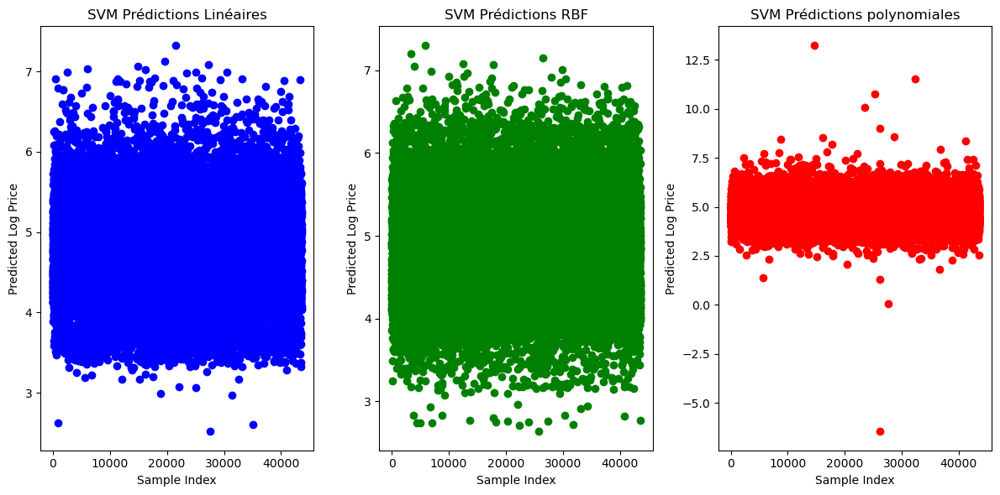

In [114]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.scatter(range(len(y_pred_svm_linear)), y_pred_svm_linear, color='blue')
plt.title('SVM Prédictions Linéaires')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Log Price')

plt.subplot(1, 3, 2)
plt.scatter(range(len(y_pred_svm_rbf)), y_pred_svm_rbf, color='green')
plt.title('SVM Prédictions RBF')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Log Price')

plt.subplot(1, 3, 3)
plt.scatter(range(len(y_pred_svm_poly)), y_pred_svm_poly, color='red')
plt.title('SVM Prédictions polynomiales')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Log Price')

plt.tight_layout()
plt.show()

À partir de ces visualisations, nous pouvons en déduire que 

SVM Linéaire (bleu) :

    - La majorité des prédictions du log_price sont concentrées entre 4 et 7.
    - Les prédictions semblent assez uniformes avec peu de variabilité.
    - Le modèle linéaire capte une relation linéaire simple mais peut manquer des relations plus complexes.
    
SVM RBF (rouge) :

    - Les prédictions sont également concentrées entre 4 et 7.
    - Cependant, il semble y avoir plus de variabilité par rapport au modèle linéaire.
    - Le modèle RBF peut capturer des relations non linéaires mais il y a une sur-concentration autour de certaines valeurs.
    
SVM Polynomial (vert) :

    - Les prédictions montrent une large dispersion, avec des valeurs allant de négatives à plus de 12.
    - La présence de valeurs aberrantes indique que le modèle polynomial a tendance à sur-ajuster les données.
    - Ce modèle peut capturer des relations non linéaires plus complexes, mais semble sur-ajuster aux données d'entraînement, résultant en des prédictions moins fiables.

D'après nos visualisations, les modèles SVM avec les noyaux linéaire et RBF semblent fournir des prédictions plus cohérentes et stables pour les prix des logements tandis que le modèle polynomial affiche une grande variabilité et des prédictions extrêmes (surajustement). Il serait judicieux de préférer les noyaux linéaire ou RBF pour une prédiction plus fiable des prix.